Alumno: Diego Ernesto Sandoval Vargas A01709113

# Contexto

## Descripción
Felicidades! Eres el orgulloso propietario de 5 robots nuevos y un almacén lleno de cajas. El dueño anterior del almacén lo dejó en completo desorden, por lo que depende de tus robots organizar las cajas en algo parecido al orden y convertirlo en un negocio exitoso.

Cada robot está equipado con ruedas omnidireccionales y, por lo tanto, puede conducir en las cuatro direcciones. Pueden recoger cajas en celdas de cuadrícula adyacentes con sus manipuladores, luego llevarlas a otra ubicación e incluso construir pilas de hasta cinco cajas. Todos los robots están equipados con la tecnología de sensores más nueva que les permite recibir datos de sensores de las cuatro celdas adyacentes. Por tanto, es fácil distinguir si un campo está libre, es una pared, contiene una pila de cajas (y cuantas cajas hay en la pila) o está ocupado por otro robot. Los robots también tienen sensores de presión equipados que les indican si llevan una caja en ese momento.

Lamentablemente, tu presupuesto resultó insuficiente para adquirir un software de gestión de agentes múltiples de última generación. Pero eso no debería ser un gran problema ... ¿verdad? Tu tarea es enseñar a sus robots cómo ordenar su almacén. La organización de los agentes depende de ti, siempre que todas las cajas terminen en pilas ordenadas de cinco.

## Puntos a considerar
-	La semilla para generación de números aleatorios será 67890.
-	El almacén es 20x20 celdas.
-	Al inicio de la simulación, tu solución deberá colocar 200 cajas repartidas en grupos de 1 a 3 cajas en posiciones aleatorias.
-	Todos los robots empiezan en posiciones aleatorias vacías. Y, sólo puede haber un robot por celda.
-	La simulación termina cuando todas las cajas se encuentra apiladas en pilas de exactamente 5 cajas.

Nota: Al final del reporte se encuentra la implementación de la solución.

# Estrategia

## Consideraciones

- Tanto movimiento como colocacion de cajas, y agentes son aleatorios.
- El agente solo puede cargar una caja a la vez.
- El agente solo obtener informacion de las 4 celdas adyacentes (arriba, abajo, izquierda, derecha).
- El agente solo puede moverse a las 4 celdas adyacentes (arriba, abajo, izquierda, derecha).

## Solucion

### Agentes

    El agente tiene 2 variables de estado:

    - carringBox: Indica si el agente tiene una caja o no.
    - lastNumBoxes: Indica la cantidad de cajas que tenia la celda de donde tomo la caja.

    Estas se utilizan para determinar el comportamiento del agente.

#### Movimiento

    El agente se mueve de manera aleatoria a una de las 4 celdas adyacentes, dependiendo si este esta cargando una caja o no elije si debe colocarla o tomar una caja.

#### Tomar Cajas

    Si el agente no esta cargando una caja este tomara una caja de alguna de las celdas adjacentes, siempre y cuando en la celda el numero de cajas sea mayor a uno y menor que 5, ya que 5 es el objetivo de las pilas.

#### Colocar Cajas

    El agente podra colocar una caja en alguna de las celdas adjacentes si cumple con las siguientes condiciones:
    - El agente esta cargando una caja.
    - La celda continene menos de 5 cajas.
    - La cenda tiene un numero de cajas igual o mayor al numero de cajas que tenia la celda de donde tomo la caja.

    Estas restriciones se implementaron para que el agente no coloque cajas en celdas que ya tienen 5 cajas, y para que busque siempre apilar cajas de una manera efectiva, al revisar si la celda tiene un numero de cajas igual o mayor al numero de cajas que tenia la celda de donde tomo la caja, se asegura que el agente no coloque cajas en celdas vacias o que rehagan pilas anteriormente formadas.

#### Colocar ultima pila

    Durante las pruebas en el modelo se identifico que las primeras 39 pilas de 40 (el objetivo de pilas que se formaran con los parametros de la simulacion) se lograban crean en los primeros 5,000 pasos y para que se formase la ultiuma pila se necesitaban alrededor de 95,000 pasos mas. Se identifico mediante difererntes simulaciones (usando diferentes semillas) que quedaban cajas en pilas de 1 repartidas. Por lo que se cambio ligeramente la estragia de soltar cajas para poder formar la ultima pila de una manera mas rapida.

    El agente al identificar que busca formar la ultima pila solo va a poder tomar cajas de celdas que tengan 1 caja, y solo va a poder colocar cajas en celdas que tengan 1 o mas cajas, esto incremento en un 3000% la velocidad de formacion de la ultima pila.

### Modelo

    Se inicializa el modelo con los parametros solicitados para la simululacion, se crea la grid y se agregan los agentes y las cajas.
    
#### Recoleccion de datos

    Para la recoleccion de datos se utilizan 3 data collectors: 

    - agent_Positions: Recolecta la posicion de cada agente en cada paso de la simulacion.
    - floor: Recolecta la cantidad de cajas en cada celda en cada paso de la simulacion.
    - LastFloor: Recolecta la cantidad de cajas en cada celda en el ultimo paso de la simulacion.

    Despues se realiza una simulacion y graficas con estos datos, para poder mostrar el inicio y el final de la simulacion, junto con los pasos intermedios. Para que la animacion de la simulacion no tome muhco tiempo en crearse se trunco a 2000 frames intercalados.

## Resultados

#### Pasos necesarios: 8669

## Otras estrategias

    Una de las posibles estrategias para reducir la cantidad de pasos necesarios para completar la simulacion sin romper las restricciones pero quitando el factor de aleatoriedad en el movimiento es:

    Realizar busquedas de caminos, para esto seria necesario que los agentes pudieiran compartir la informacion de la ubicacion y cantidad de cajas disponibles en las celas adjacentes en la que esten, para que de manera mas inteligenten puedan formar pilas de manera mas rapida, para esto deberan buscar la ruta que los diriga a las celdas con la menor numero de cajas (mayor a 0) posible y despues buscar la ruta que los diriga a las celdas con la mayor cantidad de cajas (menor a 5) posible, esto para que las pilas se formen de una manera mucho mas rapida y ordenada.

    Para complementar esta estrategia se podria realizar una maquina de estados para que durante los primeros pasos de la simulacion los agentes se muevan de manera sistema para escanear todo el almacen y compartir esa informacion con los demas agentes, para despues pasar a la fase de apilado de cajas.

In [7]:
#imports
import math
import datetime
import time as tm
import pandas as pd
import numpy as np
from mesa import Agent, Model

# Mesa imports
from mesa.space import SingleGrid
from mesa.time import RandomActivation
from mesa.datacollection import DataCollector

# Plotting imports
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
plt.rcParams["animation.html"] = "jshtml"
matplotlib.rcParams['animation.embed_limit'] = 2**128
import math

# Agent

In [8]:
# Agent Class
class robotAgent(Agent):
    def __init__(self,unique_id, model):
        super().__init__(unique_id, model)
        self.carringBox = False
        self.lastNumBoxes = 0
        self.random.seed(67890)

    def step(self):
        self.pickOrDropBox()

    # Move Random in the adjacent cells
    def move_random(self):
        possible_steps = self.model.grid.get_neighborhood(
            self.pos,   
            moore=False,
            include_center=False)

        empty_neighbors = [x for x in possible_steps if self.model.grid.is_cell_empty(x)]

        if empty_neighbors:
            new_position = self.random.choice(empty_neighbors)

            self.model.grid.move_agent(self, new_position)

    # Decides if the robot should pick or drop a box
    def pickOrDropBox(self):
        remaining_boxes = 40 - self.sumPiles()
        if(remaining_boxes == 1):
            self.pickOrDropBoxLast()
        
        if self.carringBox:
            self.dropBox()
        else:
            self.pickBox()

    # Pick a box from the floor
    def pickBox(self):
        neighbors = self.model.grid.get_neighborhood(
            self.pos, moore=False, include_center=False)
        for neighbor_pos in neighbors:
            x, y = neighbor_pos
            if self.model.floor[x, y] > 0 and self.model.floor[x, y] < 5:
                self.model.floor[x, y] -= 1
                self.carringBox = True
                break
        self.move_random()

    # Decides if the robot should pick or drop a box from the last pile
    def pickOrDropBoxLast(self):
        if self.carringBox:
            self.dropBox()
        else:
            self.pickBoxLast()

    # Pick a box for the last pile
    def pickBoxLast(self):
        neighbors = self.model.grid.get_neighborhood(
            self.pos, moore=False, include_center=False)
        for neighbor_pos in neighbors:
            x, y = neighbor_pos
            if self.model.floor[x, y] == 1 or self.model.floor[x, y] == 2:  
                self.model.floor[x, y] -= 1
                self.carringBox = True
                self.lastNumBoxes = self.model.floor[x, y]
                break
        self.move_random()

    # Drop a box in the floor
    def dropBox(self):
        neighbors = self.model.grid.get_neighborhood(
            self.pos, moore=False, include_center=False)
        for neighbor_pos in neighbors:
            x, y = neighbor_pos
            if self.model.floor[x, y] >= self.lastNumBoxes and self.model.floor[x, y] < 5:
                self.model.floor[x, y] += 1
                self.carringBox = False
                break
        self.move_random()

    # Check the number of piles in the floor
    def sumPiles(self):
        numPiles = 0
        for x in range(self.model.floor.shape[0]):
            for y in range(self.model.floor.shape[1]):
                if self.model.floor[x, y] == 5:
                    numPiles += 1
        return numPiles



        

# Model

In [9]:
# Model Class
class storageModel(Model):
    def __init__(self, width, height):
        # Initialize parameters
        self.num_agents = 5
        self.num_boxes = 200
        self.width = width
        self.height = height
        self.grid = SingleGrid(self.width, self.height, torus = False)
        self.schedule = RandomActivation(self)

        self.communicationMatrix = np.zeros((self.width, self.height))

        self.floor = np.zeros((width, height))

        # Random seed
        self.random.seed(67890)

        putted = 0

        # Put boxes in the floor
        while putted < self.num_boxes:
            quantity = self.random.randint(1, 3)

            if putted + quantity > self.num_boxes:
                quantity = self.num_boxes - putted 

            x = self.random.randint(0, self.width -1)
            y = self.random.randint(0, self.height-1)

            if self.floor[x, y] == 0:
                self.floor[x, y] = quantity
                putted += quantity


        # Create agents
        for i in range(self.num_agents):
            a = robotAgent(i, self)
            self.schedule.add(a)

            # Add the agent to a random grid cell
            x = self.random.randint(0,self.width)
            y = self.random.randint(0,self.height)
            if(self.grid.is_cell_empty((x,y))):
                self.grid.place_agent(a, (x,y))
            else:
                while not self.grid.is_cell_empty((x,y)):
                    x = self.random.randint(0,self.width)
                    y = self.random.randint(0,self.height)
                self.grid.place_agent(a, (x,y))

        self.datacollector = DataCollector(
            model_reporters={"Floor": self.getFloor,
                                "LastFloor": self.getLastFloor,
                             "AgentPosition": self.agentPosition}
        )

    # Get the information of the floor
    def getFloor(self):
        return self.floor.copy()
    
    # Get the information of last values of the floor
    def getLastFloor(self):
        return self.floor
    # Get the information of the agents position
    def agentPosition(self):
        agentsPosition = np.zeros((self.width, self.height))
        for agent in self.schedule.agents:
            x,y = agent.pos
            agentsPosition[x][y] = 1
        return agentsPosition
    
    def step(self):
        self.datacollector.collect(self)
        self.schedule.step()
        
     

In [10]:
WIDTH = 20
HEIGHT = 20

model = storageModel(WIDTH, HEIGHT)

# Check if the simulation is finished
def checkforfinish():
    goal = 40
    quantity = 0
    for i in range(WIDTH):
        for j in range(HEIGHT):
            if model.floor[i][j] == 5:
                quantity += 1
    return [quantity == goal, quantity]

lastBoxQuantity = 0

while not checkforfinish()[0]:
    model.step()
    if checkforfinish()[0]:
        break
    if checkforfinish()[1] > lastBoxQuantity:
        lastBoxQuantity = checkforfinish()[1]


print("Simulation finished")
print("steps: ", model.schedule.steps)

Simulation finished
steps:  8446


In [11]:
#Obtain the data
all_data = model.datacollector.get_model_vars_dataframe()


agentData = all_data.get("AgentPosition")
floorData = all_data.get("Floor")

In [12]:
fig, axis = plt.subplots(figsize=(6, 6))
axis.set_xticks([])
axis.set_yticks([])

animationData = all_data.get("Floor") + 10 * all_data.get("AgentPosition")

# animate the data 

total_steps = len(all_data)
step = max(1, total_steps // 2000)
animationData = animationData.iloc[::step].reset_index(drop=True)
agentData = agentData.iloc[::step].reset_index(drop=True)

patch = plt.imshow(animationData[0],  cmap=plt.cm.binary)

def animate(i):
    patch.set_data(animationData[i])

ani = animation.FuncAnimation(fig, animate, frames=len(animationData))

plt.close()

ani


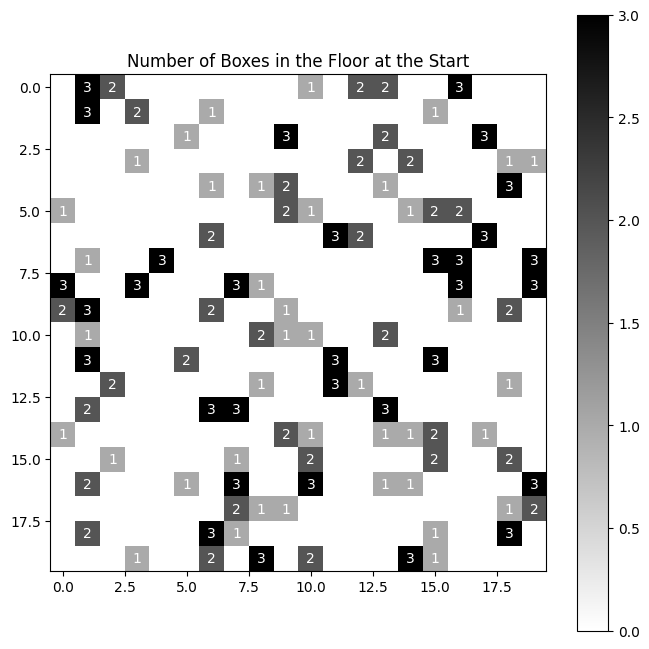

In [13]:




# Plot a heatmap of the final floor with the values of the piles
fig, axis = plt.subplots(figsize=(8, 8))
axis.set_xticks([])
axis.set_yticks([])

plt.imshow(floorData[0],
           cmap=plt.cm.binary, interpolation='nearest')

plt.colorbar()
plt.close()

# Plot a heatmap of the floor
fig, ax = plt.subplots(figsize=(8, 8))
im = ax.imshow(floorData[0], cmap=plt.cm.binary, interpolation='nearest')

# title

ax.set_title("Number of Boxes in the Floor at the Start")

# Add integer text annotations to each cell
for i in range(20):
    for j in range(20):
        text = ax.text(j, i, int(floorData[0][i, j]),
                       ha="center", va="center", color="w")

fig.colorbar(im)

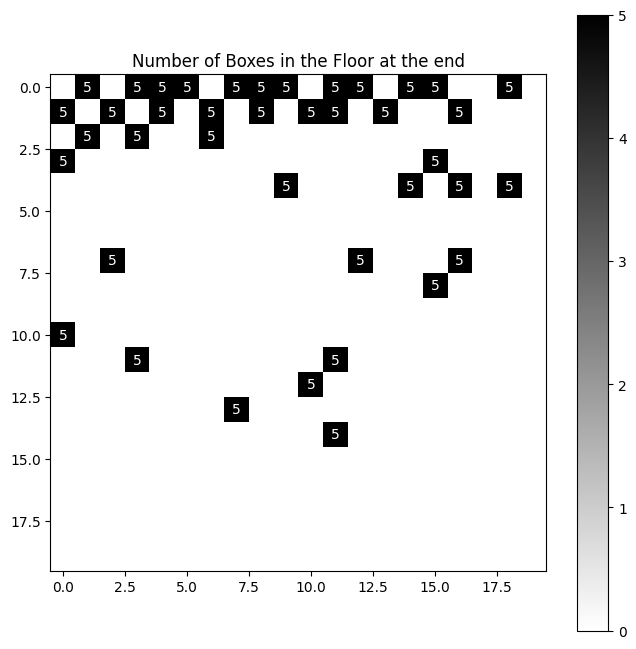

In [14]:


lastFloor = all_data.get("LastFloor")

# Plot a heatmap of the final floor with the values of the piles
fig, axis = plt.subplots(figsize=(8, 8))
axis.set_xticks([])
axis.set_yticks([])

plt.imshow(lastFloor[0],
           cmap=plt.cm.binary, interpolation='nearest')

plt.colorbar()
plt.close()

# Plot a heatmap of the floor
fig, ax = plt.subplots(figsize=(8, 8))
im = ax.imshow(lastFloor[0], cmap=plt.cm.binary, interpolation='nearest')

# title

ax.set_title("Number of Boxes in the Floor at the end")

# Add integer text annotations to each cell
for i in range(20):
    for j in range(20):
        text = ax.text(j, i, int(lastFloor[0][i, j]),
                       ha="center", va="center", color="w")

fig.colorbar(im)